In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
import matplotlib
from matplotlib.backends.backend_pdf import PdfPages
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

from utils import set_to_nan_based_on_likelihood, plot_ebc_head,filter_and_interpolate

def ebc_bins(dlc_df, bin_size_angle=12,bin_size_distance=160): 
    top_left_corner = (dlc_df.iloc[0]['top_left_corner x'], dlc_df.iloc[0]['top_left_corner y'])
    top_right_corner = (dlc_df.iloc[0]['top_right_corner x'],dlc_df.iloc[0]['top_right_corner y'])
    bottom_left_corner = (dlc_df.iloc[0]['bottom_left_corner x'], dlc_df.iloc[0]['bottom_left_corner y'])
    bottom_right_corner = (dlc_df.iloc[0]['bottom_right_corner x'], dlc_df.iloc[0]['bottom_right_corner y'])
    angle_bins = np.arange(0,360,bin_size_angle)

    diagonal_distance_arena = math.hypot(top_right_corner[0] - bottom_left_corner[0], top_right_corner[1] - bottom_left_corner[1])
    distance_bins = np.arange(0,diagonal_distance_arena,bin_size_distance)
    return distance_bins,angle_bins

def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.

    The angle should be given in radians.
    """
    ox, oy = origin
    px, py = point

    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy

def lineLineIntersection(A, B, C, D):
    # Line AB represented as a1x + b1y = c1
    a1 = B[1] - A[1]
    b1 = A[0] - B[0]
    c1 = a1*(A[0]) + b1*(A[1])
 
    # Line CD represented as a2x + b2y = c2
    a2 = D[1] - C[1]
    b2 = C[0] - D[0]
    c2 = a2*(C[0]) + b2*(C[1])
 
    determinant = a1*b2 - a2*b1
 
    if (determinant == 0):
        # The lines are parallel. This is simplified
        # by returning a pair of FLT_MAX
        return 'parallel'
    else:
        x = (b2*c1 - b1*c2)/determinant
        y = (a1*c2 - a2*c1)/determinant
        return (x, y)


def calaculate_ebc_head(dlc_df,left_drive_x,left_drive_y,right_drive_x,right_dirve_y,ebc_angle_bin_size,ebc_dist_bin_size):
    top_left_corner = (dlc_df.iloc[0]['top_left_corner x'], dlc_df.iloc[0]['top_left_corner y'])
    top_right_corner = (dlc_df.iloc[0]['top_right_corner x'],dlc_df.iloc[0]['top_right_corner y'])
    bottom_left_corner = (dlc_df.iloc[0]['bottom_left_corner x'], dlc_df.iloc[0]['bottom_left_corner y'])
    bottom_right_corner = (dlc_df.iloc[0]['bottom_right_corner x'], dlc_df.iloc[0]['bottom_right_corner y'])
    distance_bins,angle_bins = ebc_bins(dlc_df,ebc_angle_bin_size,ebc_dist_bin_size)
    ebc_data_final = []
    for i in range(len(left_drive_x)):
        print(i, len(left_drive_x), "egocentric head") #TO VIEW PROGRESS
        ebc_bins_total = np.zeros((len(distance_bins),len(angle_bins)))
        for angle in range(0,360,3):
            center_neck_pos = (left_drive_x[i],left_drive_y[i])
            center_haunch_pos = (right_drive_x[i],right_dirve_y[i]) 
            center_neck_pos = rotate(center_haunch_pos,center_neck_pos,angle=math.radians(-1*angle))
            body_angle_radian_frame = math.atan2(center_haunch_pos[1]-center_neck_pos[1],center_haunch_pos[0]-center_neck_pos[0])

            body_angle_deg_frame = math.degrees(body_angle_radian_frame)

            if body_angle_deg_frame<0:
                body_angle_deg_frame = 360+body_angle_deg_frame
            

            if(body_angle_deg_frame==0):
                #left wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index]+=1

            elif(body_angle_deg_frame>0 and body_angle_deg_frame<90):
                #left wall and top wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            elif(body_angle_deg_frame==90):
                #top wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1

            elif(body_angle_deg_frame>90 and body_angle_deg_frame<180):
                #top wall and right wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
                
            elif(body_angle_deg_frame==180):
                #right wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins) 
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1

            elif(body_angle_deg_frame>180 and body_angle_deg_frame<270):
                #right wall and bottom wall
                
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,bottom_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            elif(body_angle_deg_frame == 270):
                #bottom wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,bottom_left_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            else:
                #bottom wall and left wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,bottom_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                if min_distance<=800:
                    angle_bin_index = np.digitize(angle,angle_bins)
                    #print(i,min_distance,distance_bin_index,angle_bin_index)
                    ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
        
        ebc_data_final.append(ebc_bins_total)
    return np.array(ebc_data_final)

def egocentric_head(dlc_df, phy_df, fps, likelihood_threshold, model_dt, bin_width, file, speed_threshold, ebc_angle_bin_size,ebc_dist_bin_size):

    columns_of_interest = ['left_drive','right_drive', 'time']

    # Adding timestamps to dlc file and only considering columns of interest
    dlc_df['time'] = np.arange(len(dlc_df))/fps

    #filter and interpolate
    model_data_df,model_t = filter_and_interpolate(dlc_df,columns_of_interest,likelihood_threshold,model_dt,fps)

    model_data_df = model_data_df[model_data_df['speed']>speed_threshold]

    #model_data_df = model_data_df.dropna()

    center_neck_x = list(model_data_df['left_drive x'])
    center_neck_y = list(model_data_df['left_drive y'])
    center_haunch_x = list(model_data_df['right_drive x'])
    center_haunch_y = list(model_data_df['right_drive y'])

    ebc_data = calaculate_ebc_head(dlc_df, center_neck_x,center_neck_y,center_haunch_x,center_haunch_y,ebc_angle_bin_size,ebc_dist_bin_size)
    distance_bins,angle_bins = ebc_bins(dlc_df,ebc_angle_bin_size,ebc_dist_bin_size)

    ebc_data_avg = np.sum(ebc_data,axis=0)
    rbins = distance_bins.copy()
    abins = np.linspace(0,2*np.pi, 121)

    model_data_df['egocentric'] = list(ebc_data)

    cell_numbers = phy_df.index

    spike_data_head = []
    ebc_plot_data = []
    for i in cell_numbers:
        spike_times = phy_df.loc[i]['spikeT']

        #removing spike times after camera stopped
        spike_times = spike_times[spike_times<=max(model_t)]

        #binning spikes
        sp_count_ind = np.digitize(spike_times,bins = model_t)

        #-1 because np.digitze is 1-indexed
        sp_count_ind = [i-1 for i in sp_count_ind]

        sp_count_ind = [i for i in sp_count_ind if i in model_data_df.index]

        cell_spikes_egocentric = model_data_df['egocentric'].loc[sp_count_ind]  

        cell_spikes_avg = np.sum(cell_spikes_egocentric,axis = 0)
        cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)

        cell_spikes_avg[np.isnan(cell_spikes_avg)] = 0
        cell_spikes_avg = np.multiply(cell_spikes_avg, fps)

        ebc_plot_data.append(cell_spikes_avg)

        arr = np.zeros(len(model_t))

        # Use np.add.at for efficient indexing
        np.add.at(arr, sp_count_ind, 1)

        spike_data_head.append(arr)
    '''
    plots = []
    pdf_file = file[:-3]+'_ebc_headPlots.pdf'
    pp = PdfPages(pdf_file)
    pixels_per_cm = (dlc_df.iloc[0]['top_right_corner x'] - dlc_df.iloc[0]['top_left_corner x']) / 60

    for i in range(len(ebc_plot_data)):
        fig = plot_ebc_head(ebc_plot_data[i],i, distance_bins,ebc_angle_bin_size, pixels_per_cm)
        plots.append(fig)
        pp.savefig(fig)
    
    pp.close()
    
    spike_data_head = np.array(spike_data_head)

    np.save('spike_data_head',spike_data_head)

    np.save('egocentric_data_head_4x',np.array(ebc_data))
    '''
    return ebc_plot_data, distance_bins
    



In [3]:
#Imports
import os, fnmatch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy import stats
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
import cv2
from PIL import Image
from tkinter import Tk
from tkinter.filedialog import askdirectory

from speed import speedPlots
from body_direction import body_direction
from Egocentric import *
from Head_direction import *
from place_cells import *
from utils import *



dlc_phy_file = r'\\rhea\E\20240608\WT0008LN\FM\20240608_WT0008LN_M_FM_DMS1_angie_ephys_topDLCephys.h5'

dlc_df = pd.read_hdf(dlc_phy_file, 'dlc_df')
phy_df = pd.read_hdf(dlc_phy_file,'phy_df')
#vid_file = find('*TOP1.avi',path)

fps = 59.99
likelihood_threshold = 0.95
model_dt = 1/fps # Frame duration in seconds
bin_width = 20 #bin width angles
speed_threshold=0.25
ebc_angle_bin_size = 3
ebc_dist_bin_size = 40
pixels_per_cm = (dlc_df.iloc[0]['top_right_corner x'] - dlc_df.iloc[0]['top_left_corner x']) / 60

'''
head_plot_data, head_bin_edges = head_direction(dlc_df, phy_df, fps, likelihood_threshold, model_dt, bin_width, dlc_phy_file,speed_threshold)
body_plot_data, body_bin_edges = body_direction(dlc_df, phy_df, fps, likelihood_threshold, model_dt, bin_width, dlc_phy_file,speed_threshold)

place_cell_plots, x_edges, y_edges  = place_cells(dlc_df, phy_df, fps, likelihood_threshold, model_dt, bin_width, dlc_phy_file,speed_threshold)

velocity_list, spike_list, spike_avg_list, std_error_lower, std_error_upper, timeInSeconds = speedPlots(dlc_df, phy_df, dlc_phy_file)
'''
head_ebc_plot_data, head_distance_bins  = egocentric_head(dlc_df, phy_df, fps, likelihood_threshold, model_dt, bin_width, dlc_phy_file,speed_threshold,ebc_angle_bin_size,ebc_dist_bin_size)

0 214759 egocentric head
1 214759 egocentric head
2 214759 egocentric head
3 214759 egocentric head
4 214759 egocentric head
5 214759 egocentric head
6 214759 egocentric head
7 214759 egocentric head
8 214759 egocentric head
9 214759 egocentric head
10 214759 egocentric head
11 214759 egocentric head
12 214759 egocentric head
13 214759 egocentric head
14 214759 egocentric head
15 214759 egocentric head
16 214759 egocentric head
17 214759 egocentric head
18 214759 egocentric head
19 214759 egocentric head
20 214759 egocentric head
21 214759 egocentric head
22 214759 egocentric head
23 214759 egocentric head
24 214759 egocentric head
25 214759 egocentric head
26 214759 egocentric head
27 214759 egocentric head
28 214759 egocentric head
29 214759 egocentric head
30 214759 egocentric head
31 214759 egocentric head
32 214759 egocentric head
33 214759 egocentric head
34 214759 egocentric head
35 214759 egocentric head
36 214759 egocentric head
37 214759 egocentric head
38 214759 egocentric h

C:\Users\plab\AppData\Local\Temp\ipykernel_45856\628773210.py:213: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_45856\628773210.py:213: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_45856\628773210.py:213: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_45856\628773210.py:213: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_45856\628773210.py:213: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_45856\628773210.py:213: RuntimeWarning: invalid value encounte

d:\Pipeline\STA_Pipeline\utils.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))


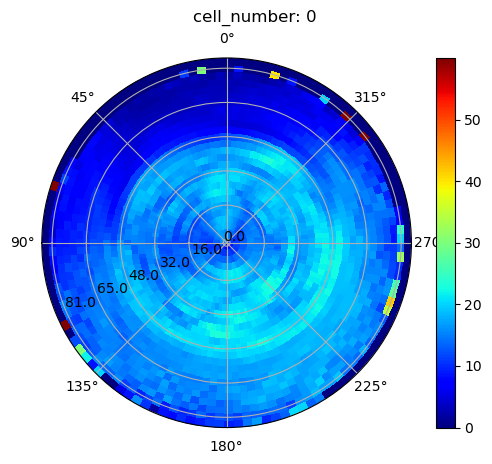

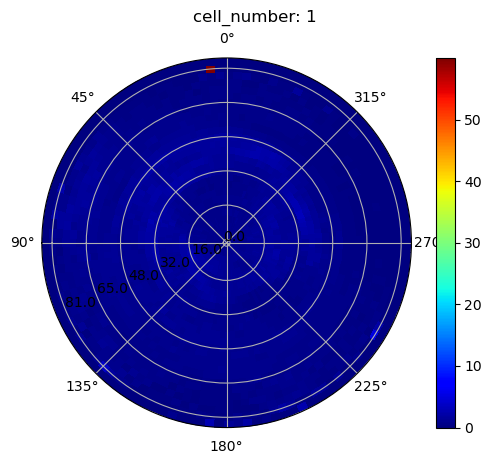

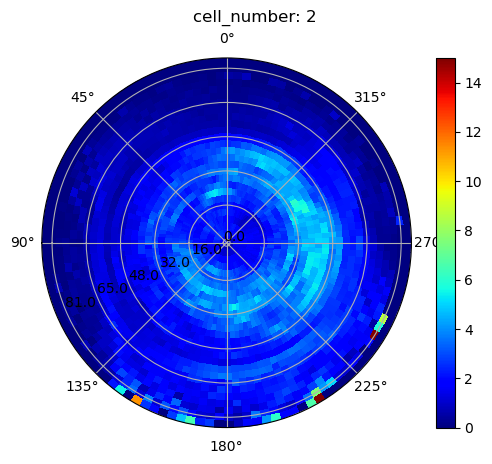

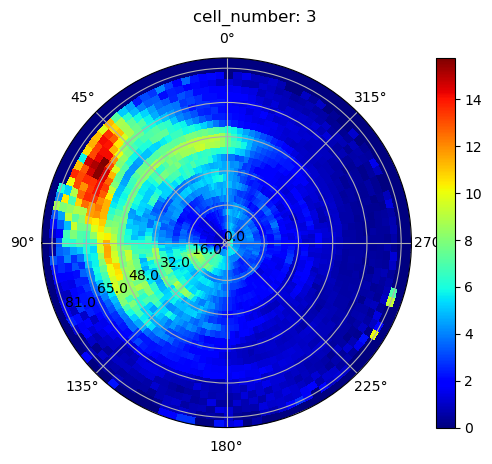

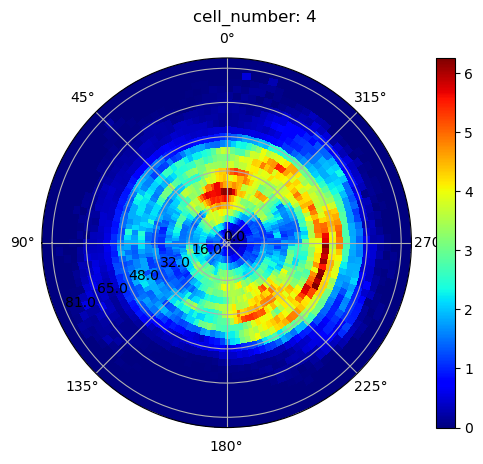

...

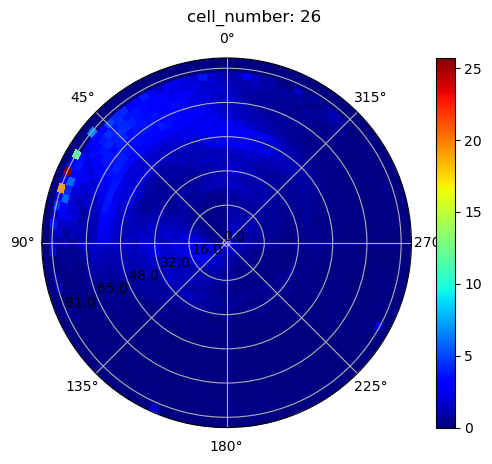

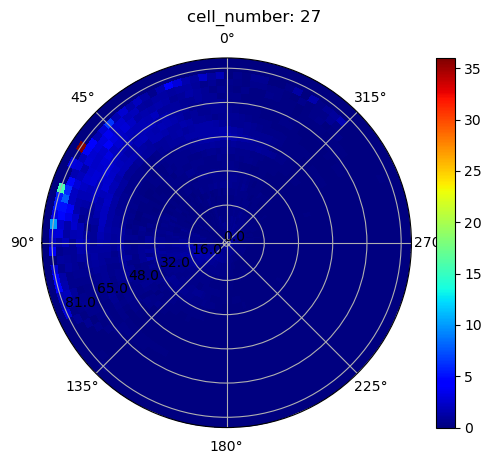

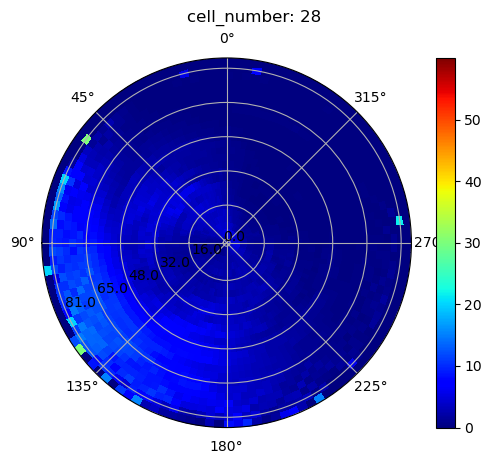

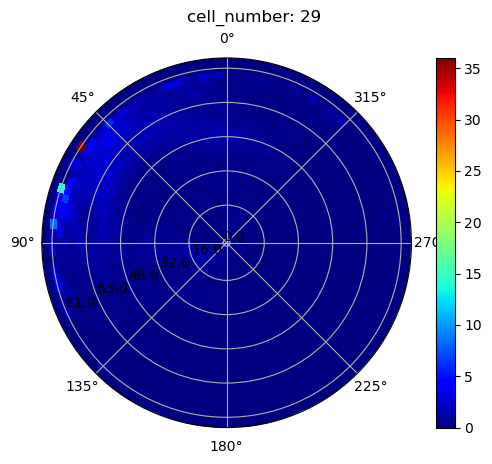

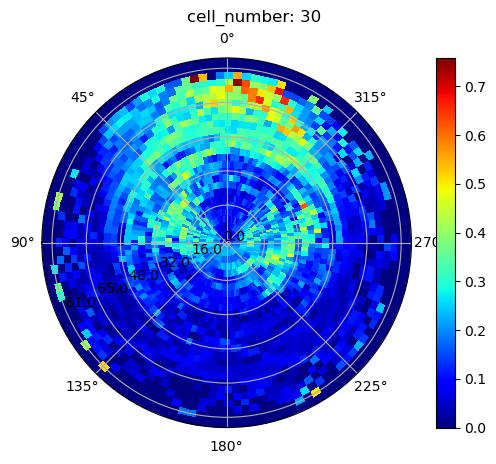

In [6]:
for i in range(len(head_ebc_plot_data)):
        fig = plot_ebc_head(head_ebc_plot_data[i],i, head_distance_bins,ebc_angle_bin_size, pixels_per_cm)
        